#imports

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

#Loading images
!attention: we should upload images before running in colab's content. because it will be automatically deleted after disconnection.

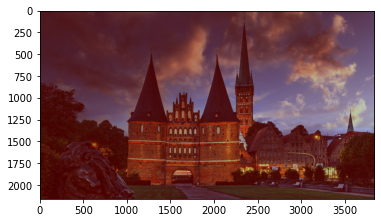

In [ ]:
image = cv2.imread('/content/LuebeckCityGate.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)

In [ ]:
#calculating the histogram of the input image:
def Hist(image):

    h, w = image.shape
    img_hist = np.zeros((256))
    for i in range(h):
        for j in range(w):
            img_hist[image[i,j]] += 1
    #nirmalizing:
    img_hist = img_hist/(h*w)
    return img_hist

In [ ]:
def cumsum(h):
	return [sum(h[:i+1]) for i in range(len(h))]

In [ ]:
def equalize(hist, L):
  hist_eq = np.zeros_like(hist)
  cdf = np.array(cumsum(hist))
  hist_eq = np.uint8((L-1) * cdf)
  return hist_eq

In [ ]:
#recreating the image:
def Rec(image, new_hist):
  h, w = image.shape
  img_copy = image.copy()
  for i in range(h):
          for j in range(w):
             img_copy[i,j] = new_hist[img_copy[i,j]] 

  return img_copy

In [ ]:
img_hist = np.zeros((3, 256)) 
equalized_hist = np.zeros((3, 256)) 

h, w = image[:, :, 0].shape
new_img = np.zeros((h, w, 3))

for k in range(3):
  img_hist[k, :] = Hist(image[:, :, k])
  equalized_hist[k, :] = equalize(img_hist[k, :],256)
  new_img[:, :, k] = Rec(image[:, :, k], equalized_hist[k, :])

In [67]:
#plt.imshow(new_img)
cv2.imwrite('result-04.jpg', new_img)

True

In [ ]:
from google.colab.patches import cv2_imshow

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4534  100  4534    0     0  37163      0 --:--:-- --:--:-- --:--:-- 37163


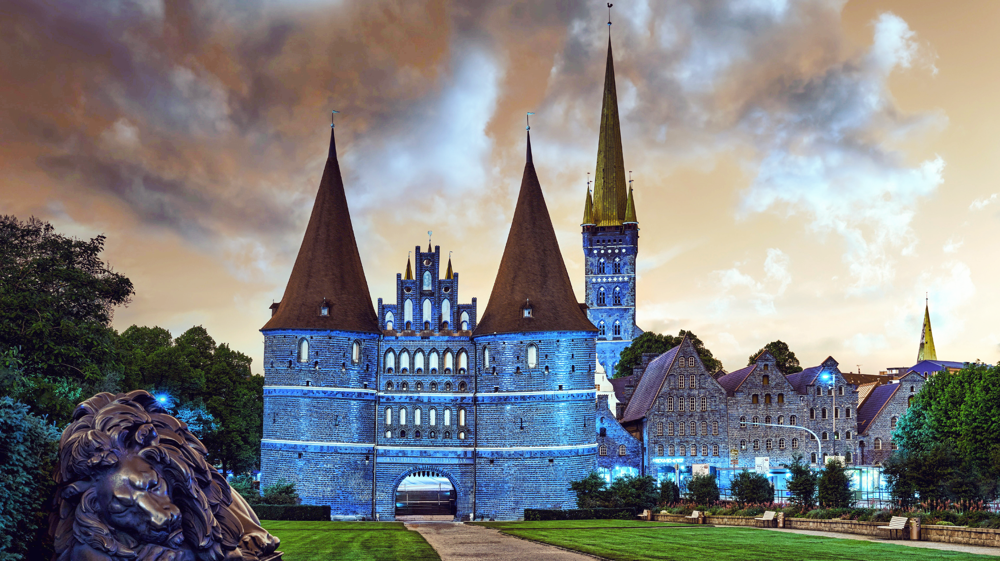

In [ ]:
!curl -o logo.png https://colab.research.google.com/img/colab_favicon_256px.png
import cv2
#plt.imshow(im)
cv2_imshow(new_img)


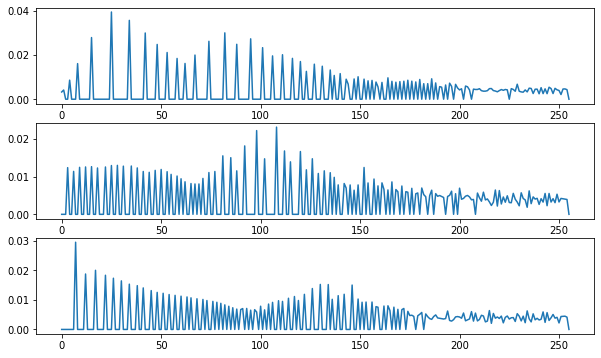

In [71]:
#histogram of the new image:
hist_img_new = np.zeros((3, 256))
new_img = new_img.astype(np.uint8)
new_img[new_img < 0] = 0
new_img[new_img > 255] = 255
for k in range(3):
  hist_img_new[k, :] = Hist(new_img[:, :, k])
fig, axs = plt.subplots(3, figsize=(10,6))
x = np.array(range(0, 256))
axs[0].plot(x, hist_img_new[0, :])
axs[1].plot(x, hist_img_new[1, :])
axs[2].plot(x, hist_img_new[2, :])
plt.savefig('result-03.jpg')

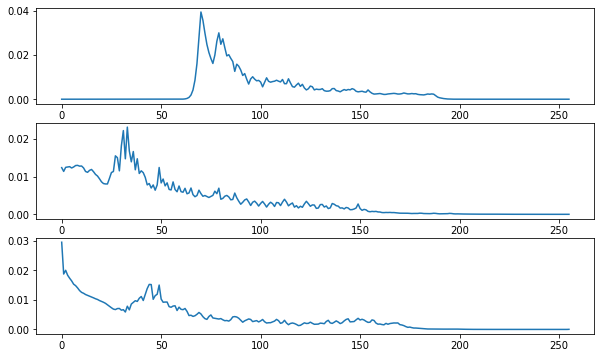

In [69]:
#histogram of the original image:
fig, axs = plt.subplots(3, figsize=(10,6))
x = np.array(range(0, 256))
axs[0].plot(x, img_hist[0, :])
axs[1].plot(x, img_hist[1, :])
axs[2].plot(x, img_hist[2, :])